# Prac 03. Part 1

For this homework you are going to implement the **unsharp masking** filter (USM). It is a technique to improve the sharpness of an image by combining the image with its blurred (unsharp) version. See the Wikipedia [page](https://en.wikipedia.org/wiki/Unsharp_masking) for more details.

### Unsharp Masking (USP)
The USM technique consists of the following steps:
* Load the image you will be working with.
* Create a blurred (unsharp) version of the original image.
* Add the unsharp image (with a certain **weight**) to the original.

To sum it up, the USM performs the following operation:

`sharpened = original + (original − unsharp) × amount`

Even though we provide you an image to work with, you are welcome to use your own images :-)

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]

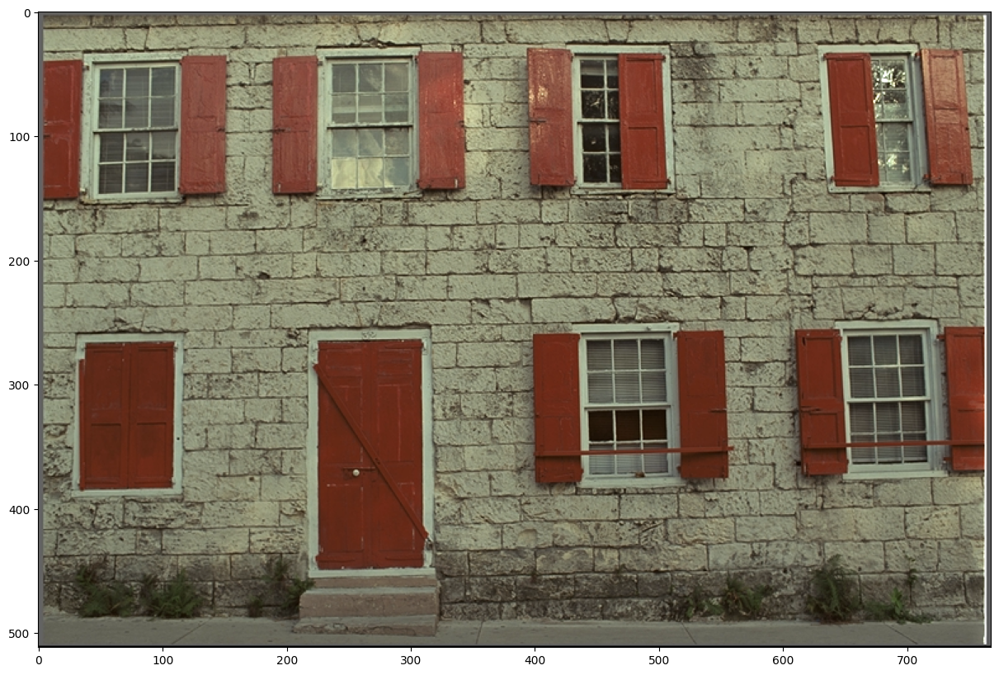

In [2]:
img = cv2.imread("/content/drive/MyDrive/Something_for_labs/kodim01.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

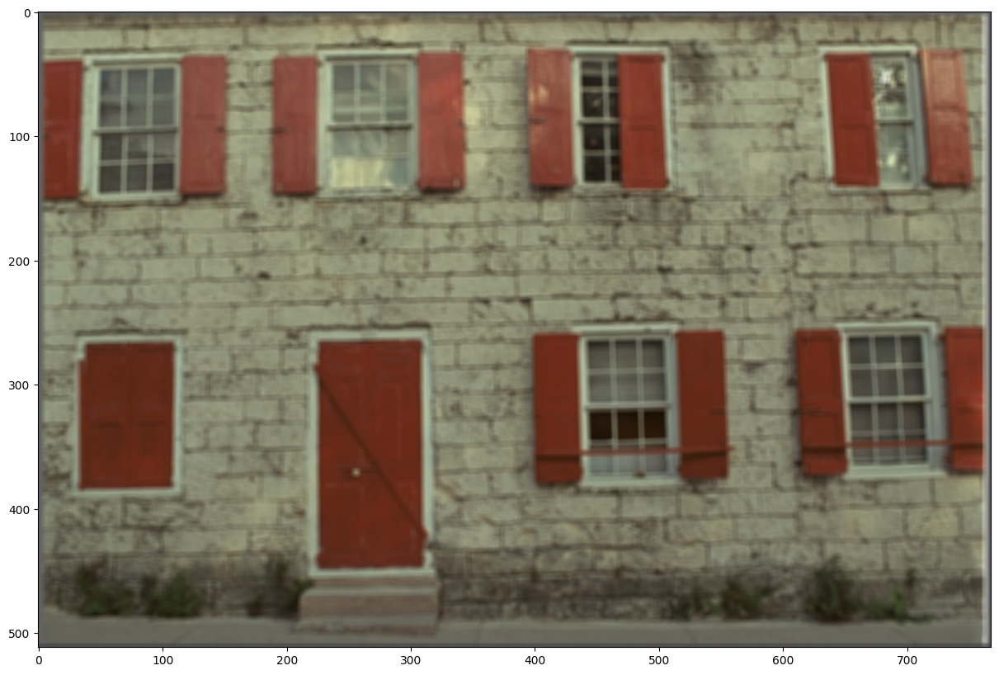

In [3]:
# Create a blurred (unsharp) version of the original image
# Test №1 | Gaussian blur
# kernel = (np.array([[1, 2, 1],
#                    [2, 4, 2],
#                    [1, 2, 1]])) / 16
# unsharp_1 = cv2.filter2D(img, -1, kernel) # -1 -- save the same type as the input image
unsharp_1 = cv2.GaussianBlur(img, (5, 5), sigmaX=0) # sigmax -- standart deviation in the X direction
# plt.imshow(unsharp_1)
# Test №2 | Convolutional blurring
kernel_2 = (np.array([[1, 1, 1, 1, 1],
                   [1, 1, 1, 1, 1],
                   [1, 1, 1, 1, 1],
                   [1, 1, 1, 1, 1],
                   [1, 1, 1, 1, 1]])) / 25
unsharp_2 = cv2.filter2D(img, -1, kernel_2)
plt.imshow(unsharp_2)
# Test №3 | Median filter (non-linear)
unsharp_3 = cv2.medianBlur(img, 5) #  all pixel in filter sort and take median in array (filter)
# plt.imshow(unsharp_3)
# Test №4 | Laplacian
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
lap = cv2.Laplacian(gray, cv2.CV_64F)
lap = cv2.convertScaleAbs(lap)
unsharp_4 = cv2.cvtColor(lap, cv2.COLOR_GRAY2RGB)
# plt.imshow(unsharp_4)


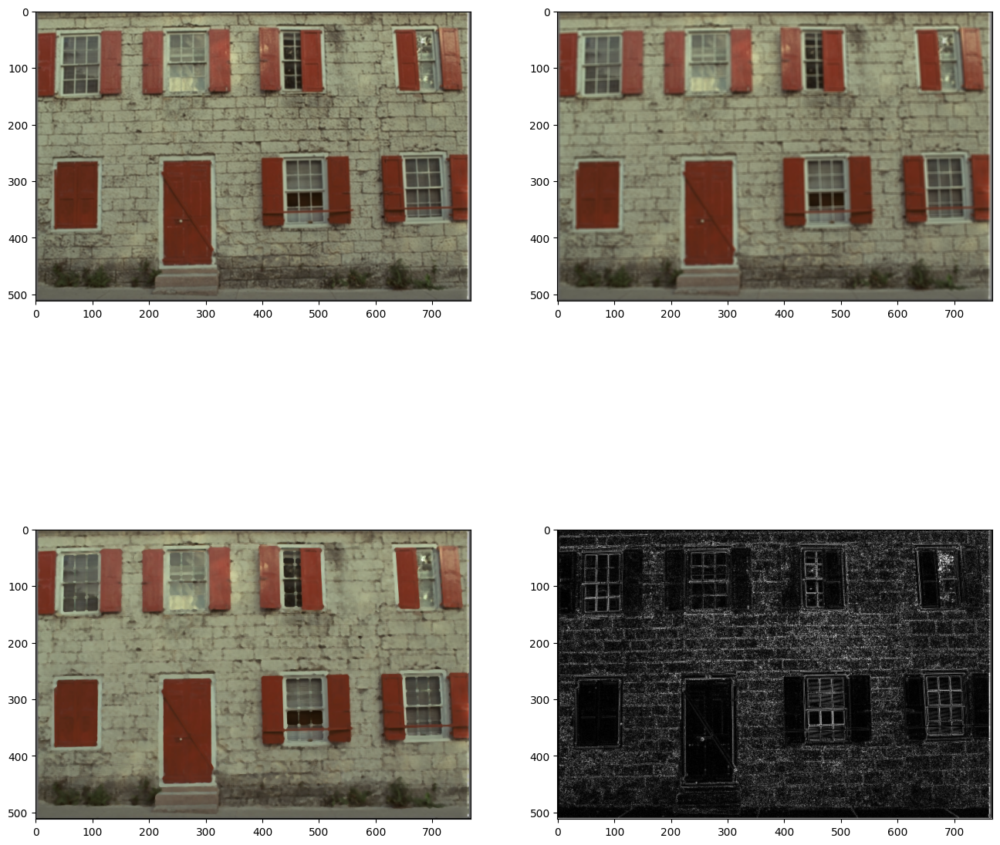

In [4]:
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
axs[0, 0].imshow(unsharp_1)
axs[0, 1].imshow(unsharp_2)
axs[1, 0].imshow(unsharp_3)
axs[1, 1].imshow(unsharp_4)

In [5]:
# Create the difference image (original − unsharp)
diff = []
for unsharp in [unsharp_1,unsharp_2, unsharp_3, unsharp_4]:
  d = img.astype(np.float32) - unsharp.astype(np.float32)
  d = cv2.normalize(d, None, 0, 255, cv2.NORM_MINMAX)
  d = d.astype(np.uint8)

  diff.append(d)



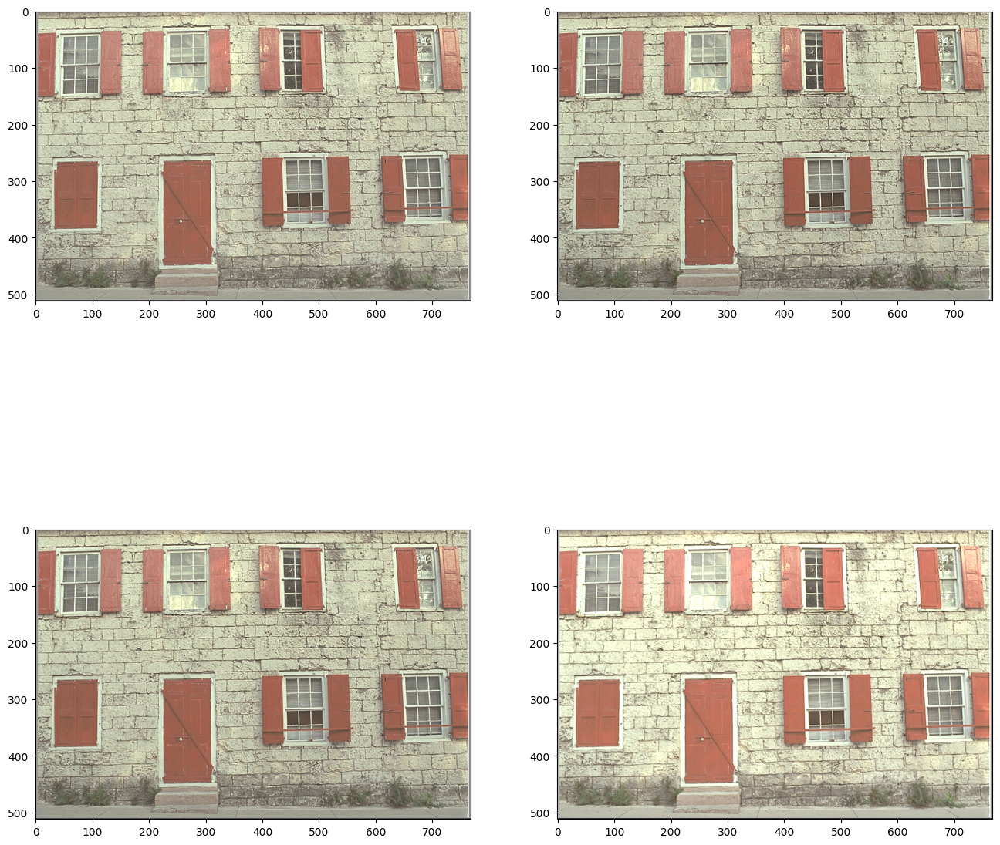

In [6]:
# Apply USM to get the resulting image using `sharpened = original + (original − unsharp) × amount`
# Note: Again, take care of underflows/overflows if necessary.

# amount Є [0.5, 2]
amount = 0.5
sharpened = []
for d in diff:
  sharpened.append(
      (np.clip((img.astype(np.float32) + d.astype(np.float32) * amount), 0, 255)).astype(np.uint8))

fig, axs = plt.subplots(2, 2, figsize=(16, 16))

axs[0, 0].imshow(sharpened[0])
axs[0, 1].imshow(sharpened[1])
axs[1, 0].imshow(sharpened[2])
axs[1, 1].imshow(sharpened[3])

What is a good (reasonable) value for the amount parameter?
What happens if it is too small?
What happens if it is too large?

# Prac 03. Part 2

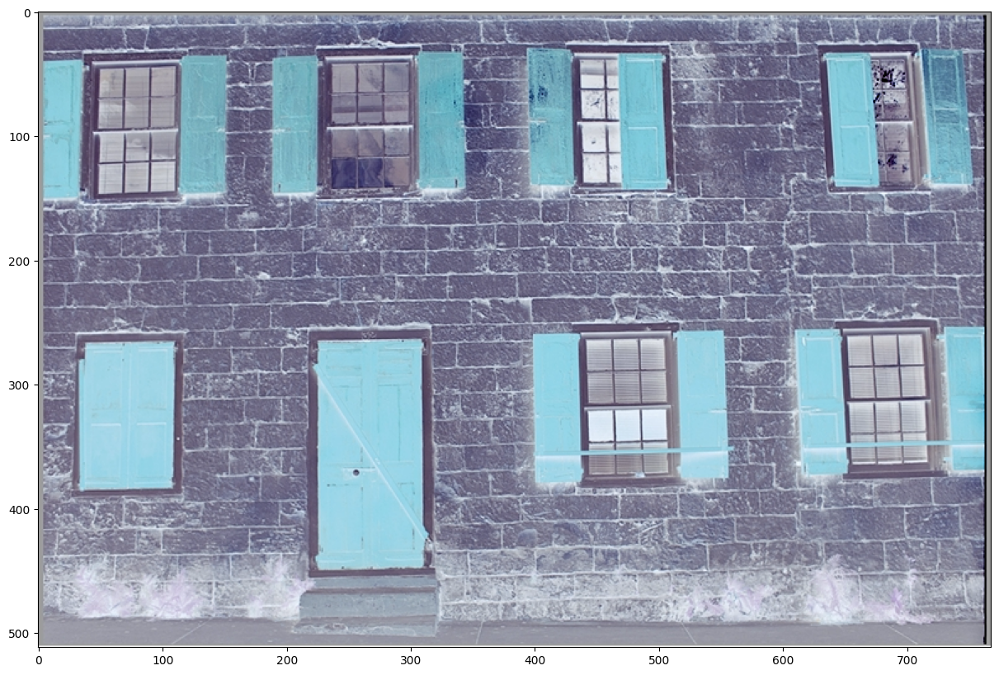

In [7]:
# a | виконує інвертування кольорової інтенсивності пікселів завантаженого
#користувачем зображення.
inversion = 255 - img
plt.imshow(inversion)

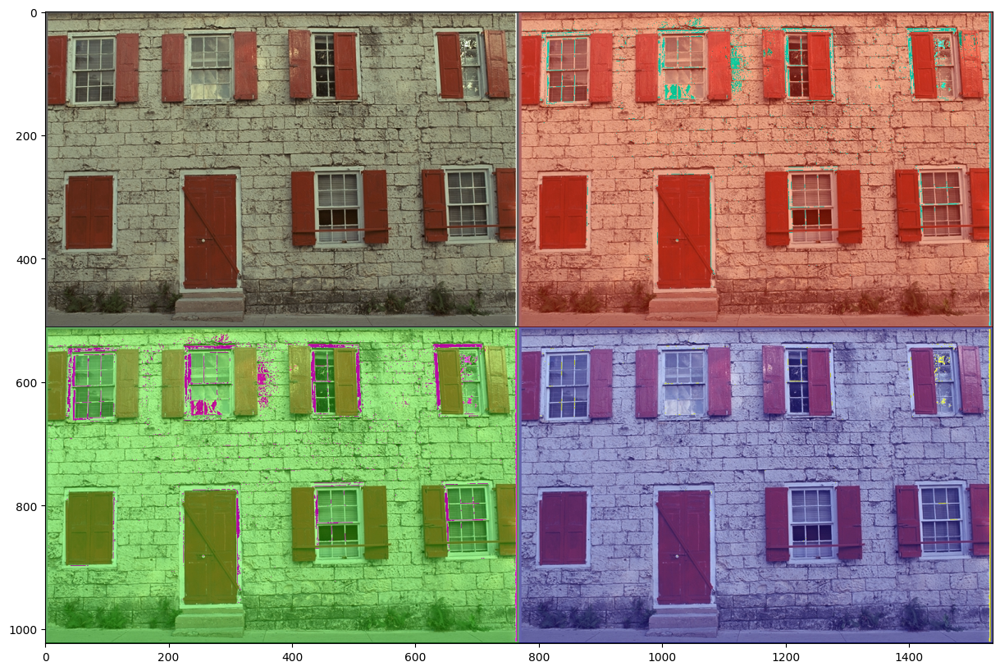

In [8]:
# b | для деякої (однієї з трьох) компонент виконує зміну, наприклад, до
# кожного пікселя додає якесь постійне значення. Вивести усі
# зображення в об’єкти типу ImageView.
img_R = img.copy()
img_G = img.copy()
img_B = img.copy()

img_R[..., 0] = np.clip(img_R[..., 0] + 75, 0, 255)
img_G[..., 1] = np.clip(img_G[..., 1] + 75, 0, 255)
img_B[..., 2] = np.clip(img_B[..., 2] + 75, 0, 255)

out1 = np.hstack([img, img_R])
out2 = np.hstack([img_G, img_B])
out = np.vstack([out1, out2])

plt.rcParams['figure.figsize'] = [15, 10]
plt.imshow(out)

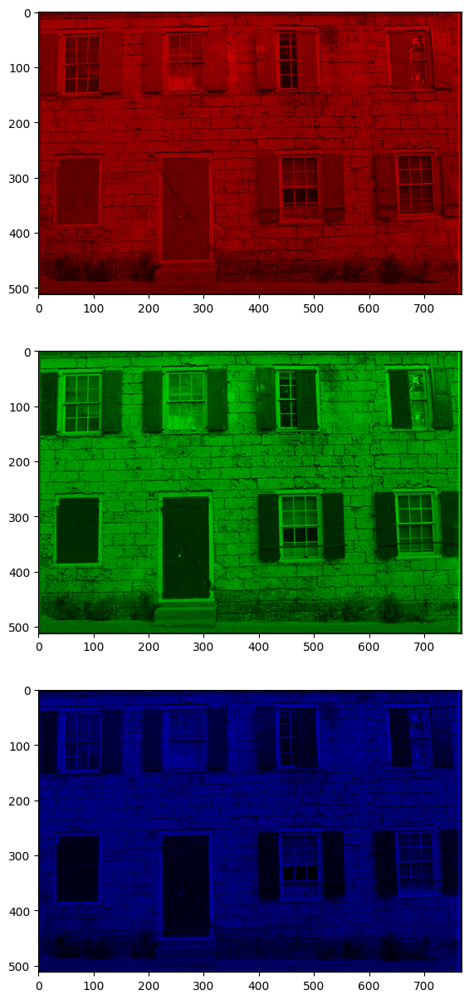

In [9]:
# c | виконує розбивку зображення на компоненти Red, Green та Blue.
r, g, b = cv2.split(img)

img_R = img.copy()
img_G = img.copy()
img_B = img.copy()

img_R[..., [1, 2]] = 0
img_G[..., [0, 2]] = 0
img_B[..., [0, 1]] = 0

fig, axs = plt.subplots(3, 1, figsize=(10, 15))

axs[0].imshow(img_R)
axs[1].imshow(img_G)
axs[2].imshow(img_B)



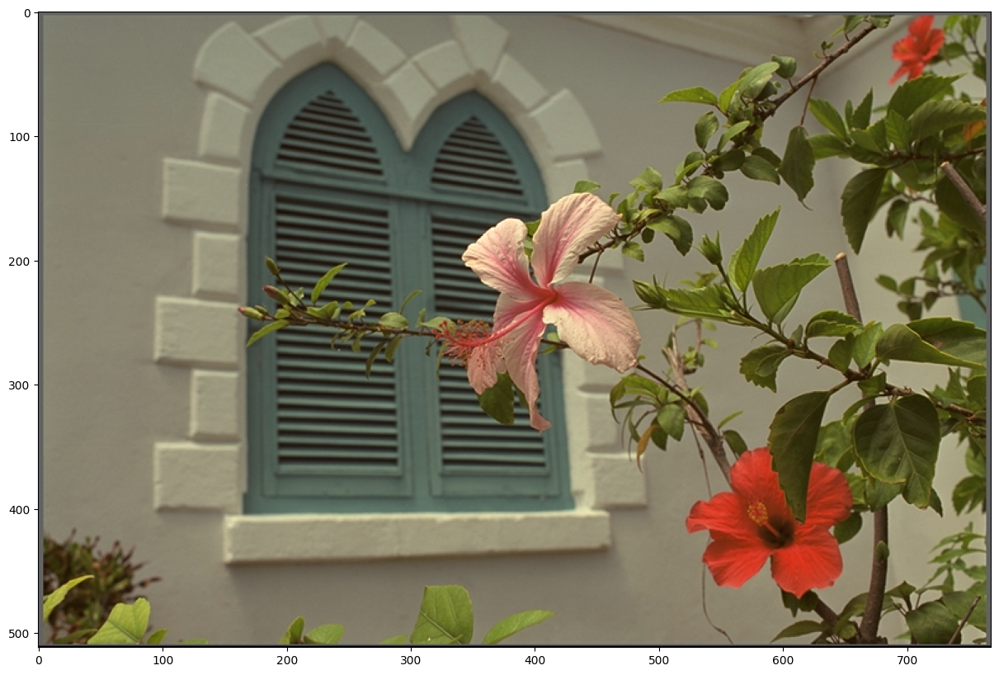

In [10]:
# d | виконує «злиття» двох зображень у певних пропорціях (долях від
# одиниці, яка береться за 100%).

import matplotlib.animation as animation
img_2 = cv2.imread('/content/drive/MyDrive/Something_for_labs/kodim07.png')
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)


fig, ax = plt.subplots()

img_bended = ax.imshow(img)

def update(frame):
  aplha_ = frame/50
  blended = cv2.addWeighted(src1=img, alpha=(1 - aplha_), src2=img_2, beta=aplha_, gamma=0)
  img_bended.set_array(blended)
  return [img_bended]

ani = animation.FuncAnimation(fig, update, frames=51, interval=100, blit=True)

# Save gif | t = frames * interval / 1000
ani.save("blend.gif", writer='pillow')

(<Axes: title={'center': 'dilation'}>,
 Text(0.5, 1.0, 'dilation'))

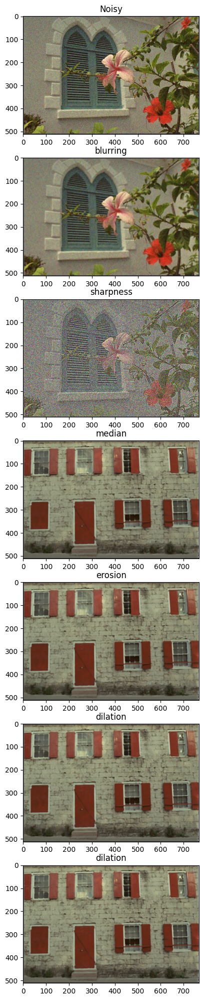

In [11]:
# e | виконує фільтрацію вхідного зображення з використанням матричних
#фільтрів, що описані у лабораторній роботі (фільтр розмиття, фільтр
#поліпшення чіткості, медіанний фільтр, фільтр ерозії і нарощування та
#фільтр Собеля).
img_2 = img_2/255 + 0.1 * np.random.randn(*img_2.shape)
img_2[img_2 < 0] = 0
img_2[img_2 > 1] = 1
img_2 = (255*img_2).astype(np.uint8)

# blurring filter
kernel_1 = (np.array([[1, 1, 1, 1],
                   [1, 1, 1, 1],
                   [1, 1, 1, 1],
                   [1, 1, 1, 1]])) / 16
img_2_1 = cv2.filter2D(img_2, ddepth=-1, kernel=kernel_1)
# sharpness filter
kernel_2 = np.array([[-1, -1, -1],
                   [-1, 9, -1],
                   [-1, -1, -1]])
img_2_2 = cv2.filter2D(img_2, ddepth=-1, kernel=kernel_2)

# Median filter (non-linear)
img_2_3 = cv2.medianBlur(img, 5)

# Erosion and dilation
kernel_4 = np.ones((3,3), np.uint8)

erosion = cv2.erode(img_2, kernel_4, iterations=1)
dilation = cv2.dilate(img_2, kernel_4, iterations=1)


plt.figure(figsize=(8, 25))

plt.subplot(711), plt.imshow(img_2), plt.title('Noisy')
plt.subplot(712), plt.imshow(img_2_1), plt.title('blurring')
plt.subplot(713), plt.imshow(img_2_2), plt.title('sharpness')
plt.subplot(714), plt.imshow(img_2_3), plt.title('median')
plt.subplot(715), plt.imshow(img_2_3), plt.title('erosion')
plt.subplot(716), plt.imshow(img_2_3), plt.title('dilation')
plt.subplot(717), plt.imshow(img_2_3), plt.title('dilation')


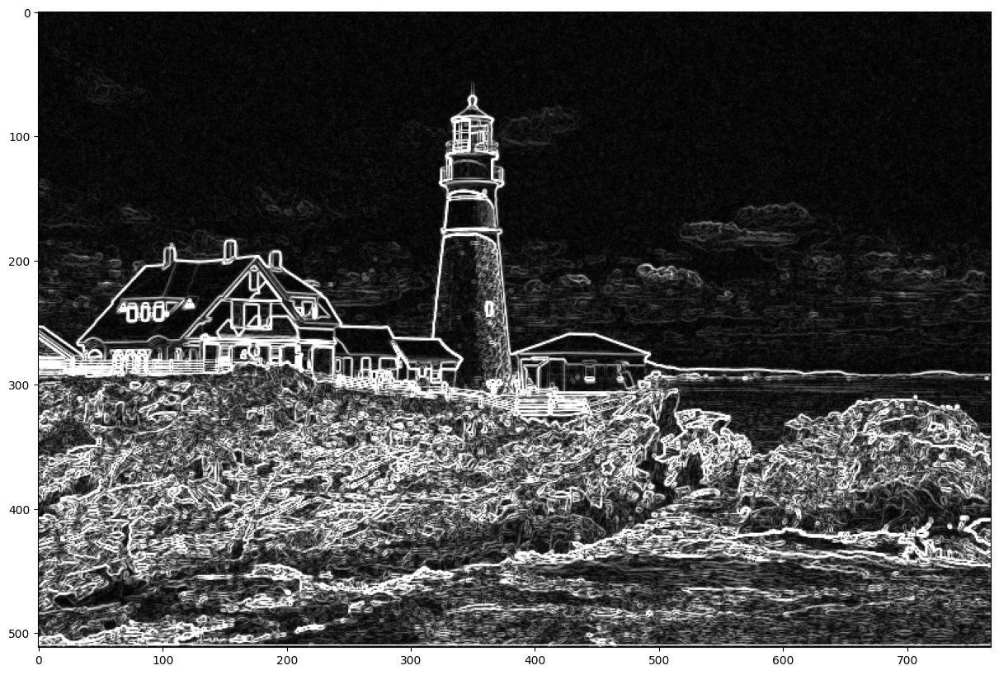

In [12]:
G_x = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]])
G_y = np.array([
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]])

img = cv2.imread("/content/drive/MyDrive/Something_for_labs/kodim21.png")
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

grad_x = cv2.filter2D(gray, cv2.CV_64F, G_x)
grad_y = cv2.filter2D(gray, cv2.CV_64F, G_y)

grad = np.sqrt(grad_x**2 + grad_y**2)
grad = cv2.convertScaleAbs(grad)

plt.imshow(grad, cmap='gray')
# plt.imshow(gray, cmap="gray")

In [18]:
# f | виконує вбудовування водяного знаку зображення.
watermark = cv2.imread('/content/drive/MyDrive/Something_for_labs/test.jpg', cv2.IMREAD_GRAYSCALE)

_, watermark_bin = cv2.threshold(watermark, 127, 1, cv2.THRESH_BINARY)
watermark_bin = watermark_bin.astype(np.uint8)
# plt.imshow(watermark_bin, cmap='gray')

def embed_watermark(container, watermark, bit_plane=1):
  h, w, _ = container.shape
  wh, ww = watermark.shape

  if (wh < h) or (ww < w):
    tile_y = (h + wh - 1) // wh
    tile_x = (w + ww - 1) // ww
    watermark_resized = np.tile(watermark, (tile_y, tile_x))[:h, :w]
  else:
    watermark_resized = watermark[:h, :w]

  watermarked = container.copy()

  blue = watermarked[:, :, 0]

  mask = ~(1 << (bit_plane - 1)) & 0xFF
  blue = blue & mask

  blue = blue | ((watermark_resized & 1) << (bit_plane -1))

  watermarked[:, :, 0] = blue
  return watermarked


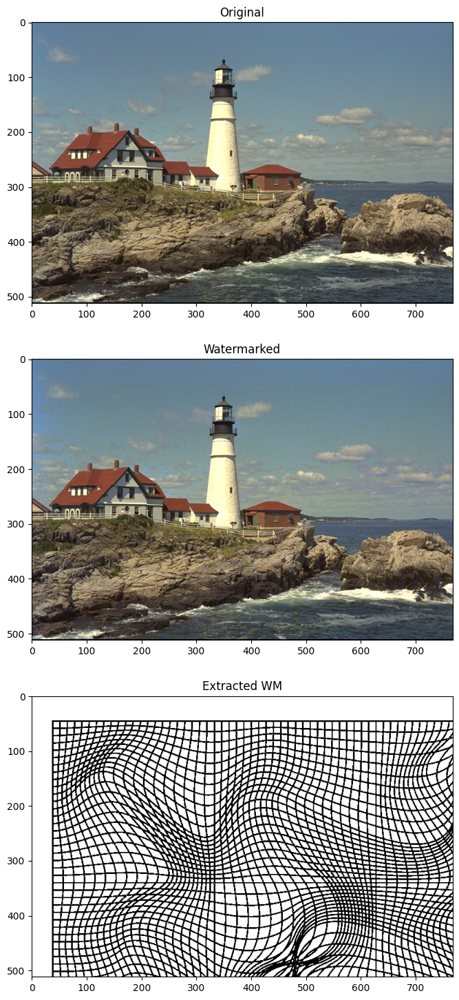

In [26]:
# g | Додатковий бал передбачається з встворення методу, який виконує
#вилучення вонядного знаку із заповненого конейнега
def extract_watermark(container, bit_plane=1):
  blue = container[:, :, 0]
  extracted = (blue >> (bit_plane - 1)) & 1
  return extracted

watermarked = embed_watermark(img, watermark=watermark_bin, bit_plane=5)
extracted = extract_watermark(watermarked, bit_plane=5)

plt.figure(figsize=(9,18))
plt.subplot(3,1,1); plt.title("Original"); plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(3,1,2); plt.title("Watermarked"); plt.imshow(cv2.cvtColor(watermarked, cv2.COLOR_BGR2RGB))
plt.subplot(3,1,3); plt.title("Extracted WM"); plt.imshow(extracted*255, cmap='gray')

In [ ]:
#1. Пояснять суть матричних фільтрів. Що таке згортка?
	# 2. Що таке стеганографія? Поясніть основний принцип вбудовування інформації на основі принципа найменшого значущого біта.
